<a href="https://colab.research.google.com/github/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/blob/main/Turbine_Energy_Yield_Prediction_for_Gas_Turbine_Optimization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#About The Project

This project uses machine learning to predict Turbine Energy Yield (TEY) from gas turbine data, Predict TEY to identify operational conditions and turbine settings that maximize energy output.
Ensures the power plant operates at its highest efficiency, reducing fuel consumption and operational costs. Use TEY predictions to identify when the system might deviate from normal operating conditions, signaling potential issues like:
Degradation of turbine components.

# About The Dataset

The dataset contains 36733 instances of 11 sensor measures aggregated over one hour (by means of average or sum) from a gas turbine located in Turkey's north western region for the purpose of studying flue gas emissions, namely CO and NOx (NO + NO2). The data comes from the same power plant as the dataset (http://archive.ics.uci.edu/ml/datasets/Combined+Cycle+Power+Plant) used for predicting hourly net energy yield. By contrast, this data is collected in another data range (01.01.2011 - 31.12.2015), includes gas turbine parameters (such as Turbine Inlet Temperature and Compressor Discharge pressure) in addition to the ambient variables. Note that the dates are not given in the instances but the data are sorted in chronological order. See the attribute information and relevant paper for details. Kindly follow the protocol mentioned in the paper (using the first three years' data for training/ cross-validation and the last two for testing) for reproducibility and comparability of works. The dataset can be well used for predicting turbine energy yield (TEY) using ambient variables as features.

## Features

The explanations of sensor measurements and their brief statistics are given below.

|Variable (Abbr.)| Unit | Min | Max | Mean|
|----------------|------|-----|-----|-----|
|Ambient temperature (AT)| C |6.23 |37.10| 17.71|
|Ambient pressure (AP)| mbar| 985.85| 1036.56 |1013.07|
|Ambient humidity (AH)| (%) |24.08 |100.20 |77.87|
|Air filter difference pressure (AFDP)| mbar| 2.09| 7.61| 3.93|
|Gas turbine exhaust pressure (GTEP)| mbar| 17.70| 40.72| 25.56|
|Turbine inlet temperature (TIT)| C |1000.85| 1100.89| 1081.43|
|Turbine after temperature (TAT)| C |511.04 |550.61| 546.16|
|Compressor discharge pressure (CDP)| mbar| 9.85| 15.16| 12.06|
|Turbine energy yield (TEY) |MWH |100.02| 179.50| 133.51|
|Carbon monoxide (CO)| mg/m3| 0.00| 44.10| 2.37|
|Nitrogen oxides (NOx)| mg/m3| 25.90| 119.91| 65.29|


#Data Preprocessing and  Visualization

##Download Datasets for training "gt_2011.csv, gt_2012.csv,gt_2013.csv"

In [ ]:
!wget https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2011.csv

--2024-12-15 16:55:37--  https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2011.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 562921 (550K) [text/plain]
Saving to: ‘gt_2011.csv’

gt_2011.csv         100%[===================>] 549.73K  2.89MB/s    in 0.2s    

2024-12-15 16:55:37 (2.89 MB/s) - ‘gt_2011.csv’ saved [562921/562921]



In [ ]:
!wget https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2012.csv

--2024-12-15 16:55:38--  https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2012.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 577617 (564K) [text/plain]
Saving to: ‘gt_2012.csv’

gt_2012.csv         100%[===================>] 564.08K  2.53MB/s    in 0.2s    

2024-12-15 16:55:39 (2.53 MB/s) - ‘gt_2012.csv’ saved [577617/577617]



In [ ]:
!wget https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2013.csv

--2024-12-15 16:55:39--  https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2013.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 540334 (528K) [text/plain]
Saving to: ‘gt_2013.csv’

gt_2013.csv         100%[===================>] 527.67K  2.67MB/s    in 0.2s    

2024-12-15 16:55:39 (2.67 MB/s) - ‘gt_2013.csv’ saved [540334/540334]



## Download Datasets for testing "gt_2014.csv, gt_2015.csv"

In [ ]:
!wget https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2014.csv

--2024-12-15 16:55:40--  https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2014.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 541009 (528K) [text/plain]
Saving to: ‘gt_2014.csv’

gt_2014.csv         100%[===================>] 528.33K  2.41MB/s    in 0.2s    

2024-12-15 16:55:40 (2.41 MB/s) - ‘gt_2014.csv’ saved [541009/541009]



In [ ]:
!wget https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2015.csv

--2024-12-15 16:55:40--  https://raw.githubusercontent.com/aneeshmurali-n/ML-Turbine-Energy-Yield-Prediction-for-Gas-Turbine-Optimization/refs/heads/main/gt_2015.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 556928 (544K) [text/plain]
Saving to: ‘gt_2015.csv’

gt_2015.csv         100%[===================>] 543.88K  2.67MB/s    in 0.2s    

2024-12-15 16:55:41 (2.67 MB/s) - ‘gt_2015.csv’ saved [556928/556928]



##Import Modules

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_regression
from statsmodels.stats.outliers_influence import variance_inflation_factor

## load data for train and concat dataframes

In [ ]:
df1=pd.read_csv("gt_2011.csv")
df2=pd.read_csv("gt_2012.csv")
df3=pd.read_csv("gt_2013.csv")

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7411 entries, 0 to 7410
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      7411 non-null   float64
 1   AP      7411 non-null   float64
 2   AH      7411 non-null   float64
 3   AFDP    7411 non-null   float64
 4   GTEP    7411 non-null   float64
 5   TIT     7411 non-null   float64
 6   TAT     7411 non-null   float64
 7   TEY     7411 non-null   float64
 8   CDP     7411 non-null   float64
 9   CO      7411 non-null   float64
 10  NOX     7411 non-null   float64
dtypes: float64(11)
memory usage: 637.0 KB


In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7628 entries, 0 to 7627
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      7628 non-null   float64
 1   AP      7628 non-null   float64
 2   AH      7628 non-null   float64
 3   AFDP    7628 non-null   float64
 4   GTEP    7628 non-null   float64
 5   TIT     7628 non-null   float64
 6   TAT     7628 non-null   float64
 7   TEY     7628 non-null   float64
 8   CDP     7628 non-null   float64
 9   CO      7628 non-null   float64
 10  NOX     7628 non-null   float64
dtypes: float64(11)
memory usage: 655.7 KB


In [ ]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7152 entries, 0 to 7151
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      7152 non-null   float64
 1   AP      7152 non-null   float64
 2   AH      7152 non-null   float64
 3   AFDP    7152 non-null   float64
 4   GTEP    7152 non-null   float64
 5   TIT     7152 non-null   float64
 6   TAT     7152 non-null   float64
 7   TEY     7152 non-null   float64
 8   CDP     7152 non-null   float64
 9   CO      7152 non-null   float64
 10  NOX     7152 non-null   float64
dtypes: float64(11)
memory usage: 614.8 KB


In [ ]:
#concat dataframes along rows
df = pd.concat([df1, df2, df3], ignore_index=True,axis=0)

In [ ]:
# make a pure copy of train dataset for pipeline
train_dataset_for_pipeline = df.copy()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22191 entries, 0 to 22190
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      22191 non-null  float64
 1   AP      22191 non-null  float64
 2   AH      22191 non-null  float64
 3   AFDP    22191 non-null  float64
 4   GTEP    22191 non-null  float64
 5   TIT     22191 non-null  float64
 6   TAT     22191 non-null  float64
 7   TEY     22191 non-null  float64
 8   CDP     22191 non-null  float64
 9   CO      22191 non-null  float64
 10  NOX     22191 non-null  float64
dtypes: float64(11)
memory usage: 1.9 MB


## Load data for test and concat dataframes

In [ ]:
df4=pd.read_csv("gt_2014.csv")
df5=pd.read_csv("gt_2015.csv")

In [ ]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7158 entries, 0 to 7157
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      7158 non-null   float64
 1   AP      7158 non-null   float64
 2   AH      7158 non-null   float64
 3   AFDP    7158 non-null   float64
 4   GTEP    7158 non-null   float64
 5   TIT     7158 non-null   float64
 6   TAT     7158 non-null   float64
 7   TEY     7158 non-null   float64
 8   CDP     7158 non-null   float64
 9   CO      7158 non-null   float64
 10  NOX     7158 non-null   float64
dtypes: float64(11)
memory usage: 615.3 KB


In [ ]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7384 entries, 0 to 7383
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      7384 non-null   float64
 1   AP      7384 non-null   float64
 2   AH      7384 non-null   float64
 3   AFDP    7384 non-null   float64
 4   GTEP    7384 non-null   float64
 5   TIT     7384 non-null   float64
 6   TAT     7384 non-null   float64
 7   TEY     7384 non-null   float64
 8   CDP     7384 non-null   float64
 9   CO      7384 non-null   float64
 10  NOX     7384 non-null   float64
dtypes: float64(11)
memory usage: 634.7 KB


In [ ]:
#concat dataframes along rows
test_df = pd.concat([df4, df5], ignore_index=True,axis=0)

In [ ]:
# make a pure copy of test dataset for pipeline
test_dataset_for_pipeline = test_df.copy()

In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14542 entries, 0 to 14541
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      14542 non-null  float64
 1   AP      14542 non-null  float64
 2   AH      14542 non-null  float64
 3   AFDP    14542 non-null  float64
 4   GTEP    14542 non-null  float64
 5   TIT     14542 non-null  float64
 6   TAT     14542 non-null  float64
 7   TEY     14542 non-null  float64
 8   CDP     14542 non-null  float64
 9   CO      14542 non-null  float64
 10  NOX     14542 non-null  float64
dtypes: float64(11)
memory usage: 1.2 MB


## Understand the Data Structure

In [ ]:
df.head() #train data

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028


In [ ]:
test_df.head() #test data

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,8.8358,1022.2,98.762,3.2422,23.152,1067.5,549.94,126.16,11.381,1.9157,68.292
1,9.0529,1021.8,97.464,3.2074,23.207,1067.9,549.80,126.51,11.476,2.0596,68.610
2,9.2464,1021.3,96.494,3.2051,23.296,1068.5,549.89,126.96,11.555,2.1621,68.324
3,9.3792,1020.9,95.912,3.2159,23.465,1069.6,549.94,127.83,11.539,2.1214,67.619
4,9.5757,1020.8,95.412,3.1898,23.205,1068.1,549.83,126.56,11.484,2.1549,66.499


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22191 entries, 0 to 22190
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      22191 non-null  float64
 1   AP      22191 non-null  float64
 2   AH      22191 non-null  float64
 3   AFDP    22191 non-null  float64
 4   GTEP    22191 non-null  float64
 5   TIT     22191 non-null  float64
 6   TAT     22191 non-null  float64
 7   TEY     22191 non-null  float64
 8   CDP     22191 non-null  float64
 9   CO      22191 non-null  float64
 10  NOX     22191 non-null  float64
dtypes: float64(11)
memory usage: 1.9 MB


The df contains 22191 rows and 11 columns no null values present and dtype is float64  

In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14542 entries, 0 to 14541
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      14542 non-null  float64
 1   AP      14542 non-null  float64
 2   AH      14542 non-null  float64
 3   AFDP    14542 non-null  float64
 4   GTEP    14542 non-null  float64
 5   TIT     14542 non-null  float64
 6   TAT     14542 non-null  float64
 7   TEY     14542 non-null  float64
 8   CDP     14542 non-null  float64
 9   CO      14542 non-null  float64
 10  NOX     14542 non-null  float64
dtypes: float64(11)
memory usage: 1.2 MB


The test_df contains 14542 rows and 11 columns no null values present and dtype is float64

In [ ]:
df.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000
mean,17.712247,1012.812607,79.555224,4.037750,25.317873,1083.080280,545.520170,133.537393,12.060208,2.214390,68.776529
std,7.352789,6.396588,13.915018,0.810223,4.234147,16.840765,7.708708,16.026107,1.114265,2.295746,11.036231
min,0.289850,985.850000,27.504000,2.087400,17.878000,1000.800000,512.450000,100.170000,9.875400,0.000388,27.765000
25%,11.664500,1008.800000,70.294500,3.449850,22.736000,1074.600000,542.600000,124.260000,11.395000,0.995375,61.548000
50%,17.739000,1012.400000,82.781000,4.068800,24.989000,1088.100000,549.900000,133.770000,12.001000,1.524200,67.096000
75%,23.657000,1016.700000,90.532000,4.451400,26.839000,1095.300000,550.050000,138.645000,12.443500,2.542400,74.572000
max,34.929000,1034.200000,100.200000,7.610600,37.402000,1100.800000,550.610000,174.610000,15.081000,44.103000,119.910000


In [ ]:
test_df.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,14542.000000,14542.000000,14542.000000,14542.000000,14542.000000,14542.000000,14542.000000,14542.000000,14542.000000,14542.000000,14542.000000
mean,17.713458,1013.463197,75.290819,3.754252,25.939087,1078.906842,547.132631,133.459114,12.061010,2.613695,59.977327
std,7.589885,6.544624,14.893508,0.680248,4.108871,18.262380,5.100267,14.975901,1.048775,2.189435,10.577052
min,-6.234800,989.400000,24.085000,2.151700,17.698000,1002.900000,511.040000,100.020000,9.851800,0.001640,25.905000
25%,11.981000,1008.800000,65.620250,3.276200,23.297250,1069.900000,545.570000,124.620000,11.456250,1.468725,53.045000
50%,17.877000,1012.800000,77.086500,3.760950,25.224000,1079.500000,549.850000,132.580000,11.914000,1.956000,58.127500
75%,23.684000,1017.500000,86.305000,4.231275,29.764000,1099.500000,550.040000,146.010000,13.065000,3.120575,64.316000
max,37.103000,1036.600000,100.100000,6.738600,40.716000,1100.900000,550.600000,179.500000,15.159000,41.097000,119.680000


## Handle Missing Data


In [ ]:
df.isnull().sum()

,0
AT,0
AP,0
AH,0
AFDP,0
GTEP,0
TIT,0
TAT,0
TEY,0
CDP,0
CO,0


In [ ]:
test_df.isnull().sum()

,0
AT,0
AP,0
AH,0
AFDP,0
GTEP,0
TIT,0
TAT,0
TEY,0
CDP,0
CO,0


This dataset contains no missing values

## Handle Duplicates


In [ ]:
#check duplicates in df
df.duplicated().sum()

0

The train df does not have any duplicate values.

In [ ]:
# check duplicates in test_df
test_df.duplicated().sum()

7

In [ ]:
# view the duplicated entries
test_df[test_df.duplicated()]

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
4208,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
4209,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
4210,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
4211,23.156,1004.2,95.938,4.0547,24.672,1076.6,549.87,127.01,11.835,1.7056,47.352
5198,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564
5199,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564
5200,26.067,1008.3,87.328,5.0703,29.984,1099.1,546.78,146.14,13.038,1.3163,52.564


In [ ]:
#Remove duplicates
test_df.drop_duplicates(inplace=True,ignore_index=True)

In [ ]:
test_df.duplicated().sum()

0

now the duplicates are gone

In [ ]:
# check test_df info
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14535 entries, 0 to 14534
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      14535 non-null  float64
 1   AP      14535 non-null  float64
 2   AH      14535 non-null  float64
 3   AFDP    14535 non-null  float64
 4   GTEP    14535 non-null  float64
 5   TIT     14535 non-null  float64
 6   TAT     14535 non-null  float64
 7   TEY     14535 non-null  float64
 8   CDP     14535 non-null  float64
 9   CO      14535 non-null  float64
 10  NOX     14535 non-null  float64
dtypes: float64(11)
memory usage: 1.2 MB


## Data Transformation


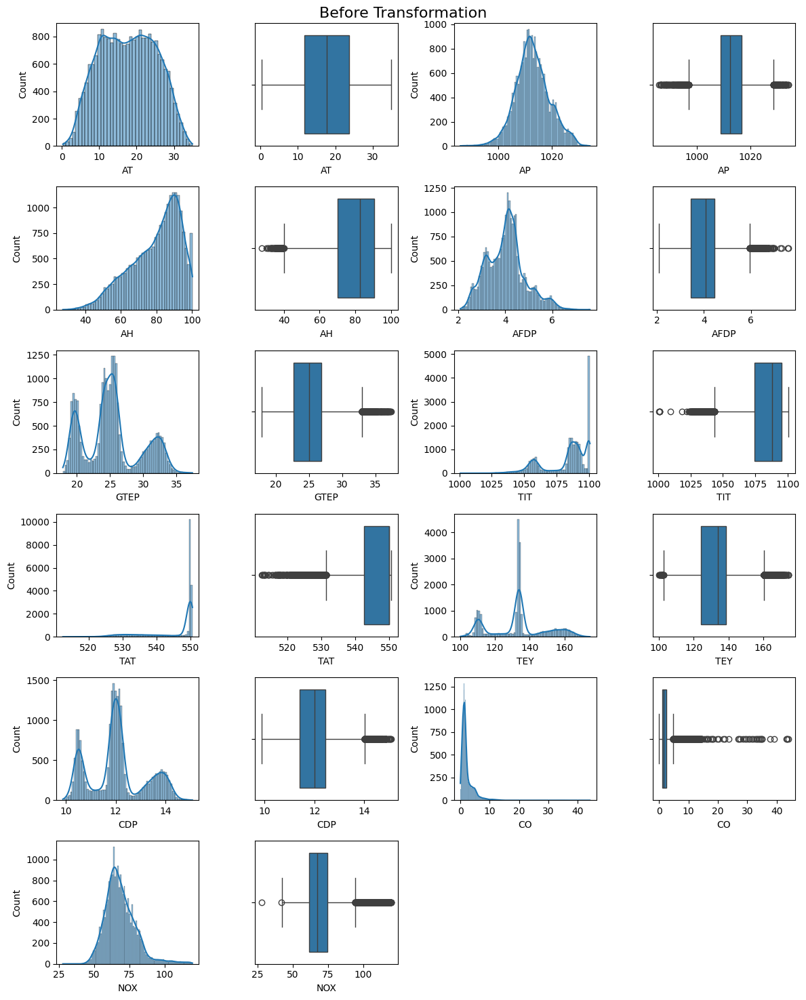

In [ ]:
# check distribution and outliers
column_names = df.columns.tolist()
index = 0
plt.figure(figsize=(12,15))
plt.suptitle("Before Transformation", fontsize = 16)
for col in column_names:
    index+=1
    plt.subplot(6,4,index)
    sns.histplot(x=df[col],kde=True)
    index+=1
    plt.subplot(6,4,index)
    sns.boxplot(x=df[col])
plt.tight_layout()
plt.show()

In [ ]:
# check skewness
df.skew()

,0
AT,0.008795
AP,0.060079
AH,-0.717952
AFDP,0.375518
GTEP,0.389969
TIT,-1.025936
TAT,-1.498290
TEY,0.145320
CDP,0.269352
CO,4.932390


* AT	0.008795	Nearly symmetric (very low skew).	No transformation needed.
* AP	0.060079	Nearly symmetric (very low skew).	No transformation needed.
* AH	-0.717952	Moderately negatively skewed.	Apply np.square() or inverse.
* AFDP	0.375518	Mildly positively skewed.	No transformation needed (optional).
* GTEP	0.389969	Mildly positively skewed.	No transformation needed (optional).
* TIT	-1.025936	Strongly negatively skewed.	Apply np.square() or inverse.
* TAT	-1.498290	Highly negatively skewed.	Apply np.square() or inverse.
* TEY	0.145320	Nearly symmetric (very low skew).	No transformation needed.
* CDP	0.269352	Mildly positively skewed.	No transformation needed (optional).
* CO	4.932390	Highly positively skewed (extreme skew).	Apply np.log1p().
* NOX	1.113055	Strongly positively skewed.	Apply np.sqrt() or np.log1p()

In [ ]:
# transform skewed features
df['AH'] = np.square(df['AH'])
df['TIT'] = np.square(df['TIT'])
df['TAT'] = np.square(df['TAT'])
df['CO'] = np.log1p(df['CO'])
df['NOX'] = np.log1p(df['NOX'])

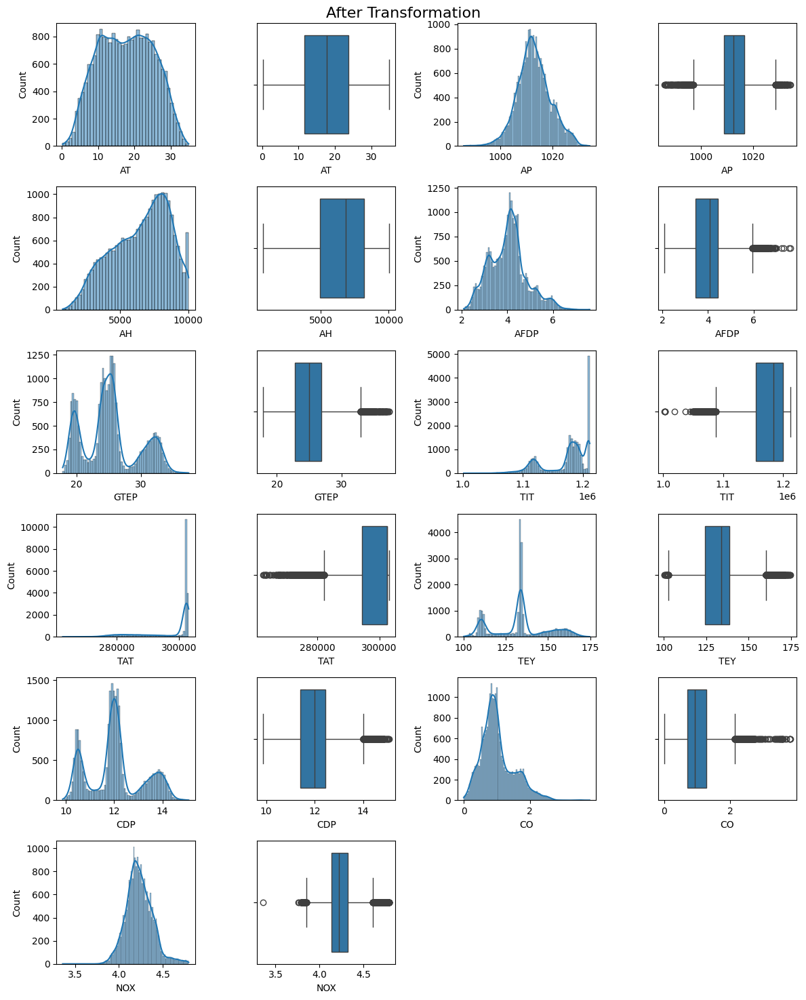

In [ ]:
# check distribution and outliers after skewness treatment
column_names = df.columns.tolist()
index = 0
plt.figure(figsize=(12,15))
plt.suptitle("After Transformation", fontsize = 16)
for col in column_names:
    index+=1
    plt.subplot(6,4,index)
    sns.histplot(x=df[col],kde=True)
    index+=1
    plt.subplot(6,4,index)
    sns.boxplot(x=df[col])
plt.tight_layout()
plt.show()

In [ ]:
# check skew after transform
df.skew()

,0
AT,0.008795
AP,0.060079
AH,-0.383961
AFDP,0.375518
GTEP,0.389969
TIT,-1.003764
TAT,-1.484918
TEY,0.145320
CDP,0.269352
CO,0.901451


In [ ]:
df.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,2.219100e+04,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000
mean,17.712247,1012.812607,6522.652738,4.037750,25.317873,1.173346e+06,297651.677255,133.537393,12.060208,1.018982,4.233604
std,7.352789,6.396588,2086.373921,0.810223,4.234147,3.618991e+04,8321.618186,16.026107,1.114265,0.503339,0.151014
min,0.289850,985.850000,756.470016,2.087400,17.878000,1.001601e+06,262605.002500,100.170000,9.875400,0.000387,3.359159
25%,11.664500,1008.800000,4941.316730,3.449850,22.736000,1.154765e+06,294414.760000,124.260000,11.395000,0.690832,4.135934
50%,17.739000,1012.400000,6852.693961,4.068800,24.989000,1.183962e+06,302390.010000,133.770000,12.001000,0.925924,4.220918
75%,23.657000,1016.700000,8196.043024,4.451400,26.839000,1.199682e+06,302555.002500,138.645000,12.443500,1.264804,4.325086
max,34.929000,1034.200000,10040.040000,7.610600,37.402000,1.211761e+06,303171.372100,174.610000,15.081000,3.808949,4.795046


## Handle Outliers

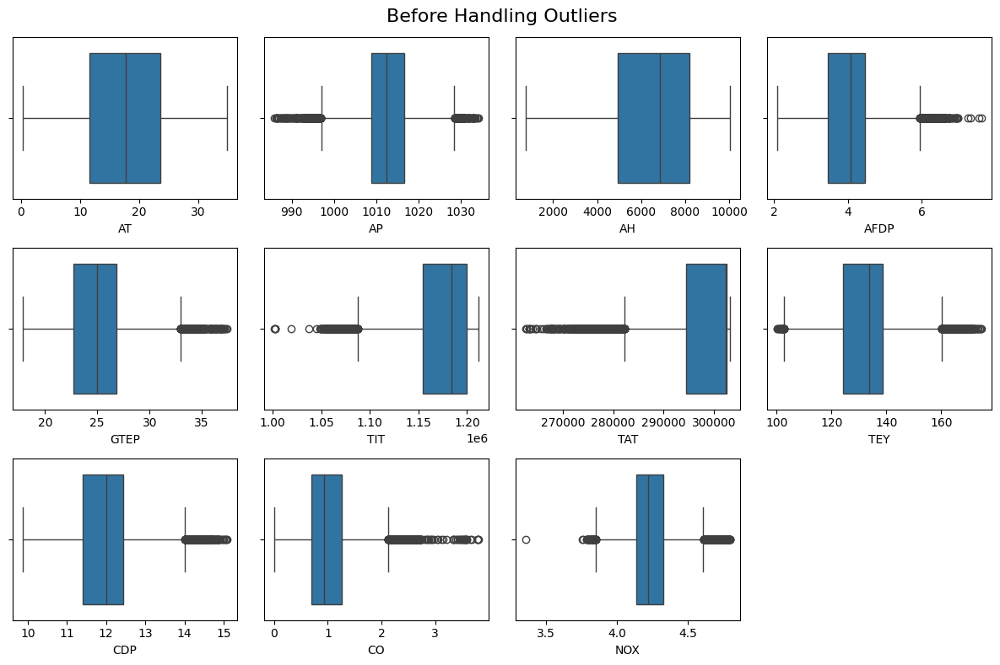

In [ ]:
# check outliers
column_names = df.columns.tolist()
index = 0
plt.figure(figsize=(12,8))
plt.suptitle("Before Handling Outliers", fontsize = 16)
for col in column_names:
    index+=1
    plt.subplot(3,4,index)
    sns.boxplot(x=df[col])
plt.tight_layout()
plt.show()

#### Cap outliers with Zscore methode and make a new df 'zdf'

In [ ]:
zdf = df.copy() # make a df copy to make outlier capped df with z score methode
column_names = zdf.columns.tolist()
for col in column_names:               # loop through every column in zdf
    z_score = zscore(zdf[col])         # calculate the Z-score for the column
    outlier_mask = np.abs(z_score) > 3 # make mask of outliers
    upper_bound = zdf[col][~outlier_mask].max() # invert the mask and get the max of non outlier value
    lower_bound = zdf[col][~outlier_mask].min() # invert the mask and get the min of non outlier value
    zdf[col] = np.where(z_score > 3, upper_bound, np.where(z_score < -3, lower_bound, zdf[col])) # cap the outlier values

In [ ]:
df.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,2.219100e+04,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000
mean,17.712247,1012.812607,6522.652738,4.037750,25.317873,1.173346e+06,297651.677255,133.537393,12.060208,1.018982,4.233604
std,7.352789,6.396588,2086.373921,0.810223,4.234147,3.618991e+04,8321.618186,16.026107,1.114265,0.503339,0.151014
min,0.289850,985.850000,756.470016,2.087400,17.878000,1.001601e+06,262605.002500,100.170000,9.875400,0.000387,3.359159
25%,11.664500,1008.800000,4941.316730,3.449850,22.736000,1.154765e+06,294414.760000,124.260000,11.395000,0.690832,4.135934
50%,17.739000,1012.400000,6852.693961,4.068800,24.989000,1.183962e+06,302390.010000,133.770000,12.001000,0.925924,4.220918
75%,23.657000,1016.700000,8196.043024,4.451400,26.839000,1.199682e+06,302555.002500,138.645000,12.443500,1.264804,4.325086
max,34.929000,1034.200000,10040.040000,7.610600,37.402000,1.211761e+06,303171.372100,174.610000,15.081000,3.808949,4.795046


In [ ]:
zdf.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000,2.219100e+04,22191.000000,22191.000000,22191.000000,22191.000000,22191.000000
mean,17.712247,1012.822323,6522.652738,4.037050,25.317873,1.173385e+06,297666.746621,133.537393,12.060208,1.017121,4.233091
std,7.352789,6.358006,2086.373921,0.807915,4.234147,3.606057e+04,8271.100931,16.026107,1.114265,0.496338,0.149176
min,0.289850,993.670000,756.470016,2.087400,17.878000,1.065024e+06,272703.284100,100.170000,9.875400,0.000387,3.788680
25%,11.664500,1008.800000,4941.316730,3.449850,22.736000,1.154765e+06,294414.760000,124.260000,11.395000,0.690832,4.135934
50%,17.739000,1012.400000,6852.693961,4.068800,24.989000,1.183962e+06,302390.010000,133.770000,12.001000,0.925924,4.220918
75%,23.657000,1016.700000,8196.043024,4.451400,26.839000,1.199682e+06,302555.002500,138.645000,12.443500,1.264804,4.325086
max,34.929000,1032.000000,10040.040000,6.467800,37.402000,1.211761e+06,303171.372100,174.610000,15.081000,2.527327,4.686197


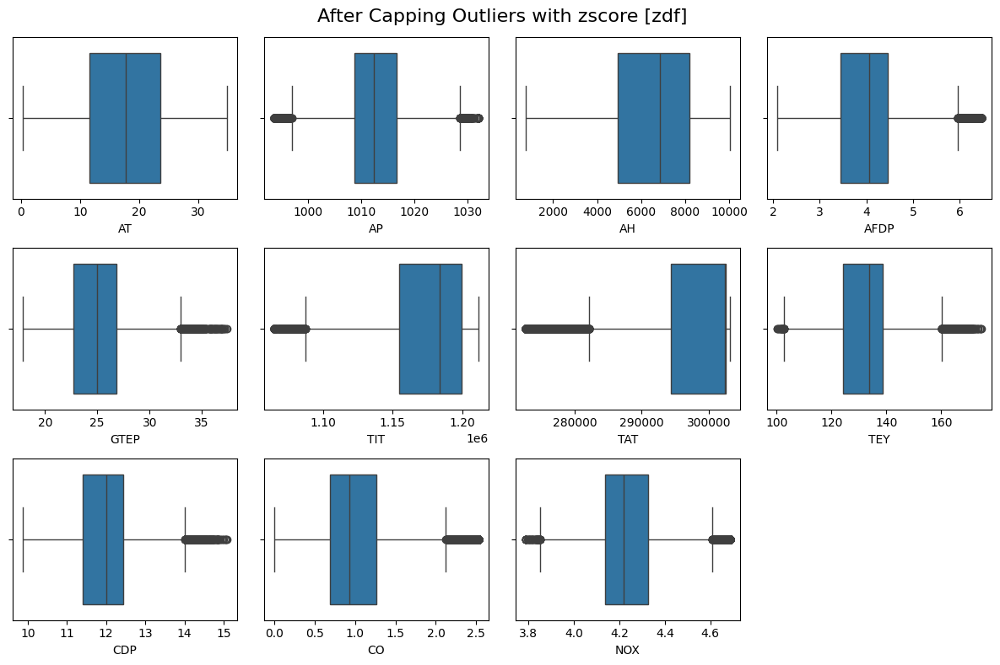

In [ ]:
# check outliers after capping with z score
column_names = zdf.columns.tolist()
index = 0
plt.figure(figsize=(12,8))
plt.suptitle("After Capping Outliers with zscore [zdf]", fontsize = 16)
for col in column_names:
    index+=1
    plt.subplot(3,4,index)
    sns.boxplot(x=zdf[col])
plt.tight_layout()
plt.show()

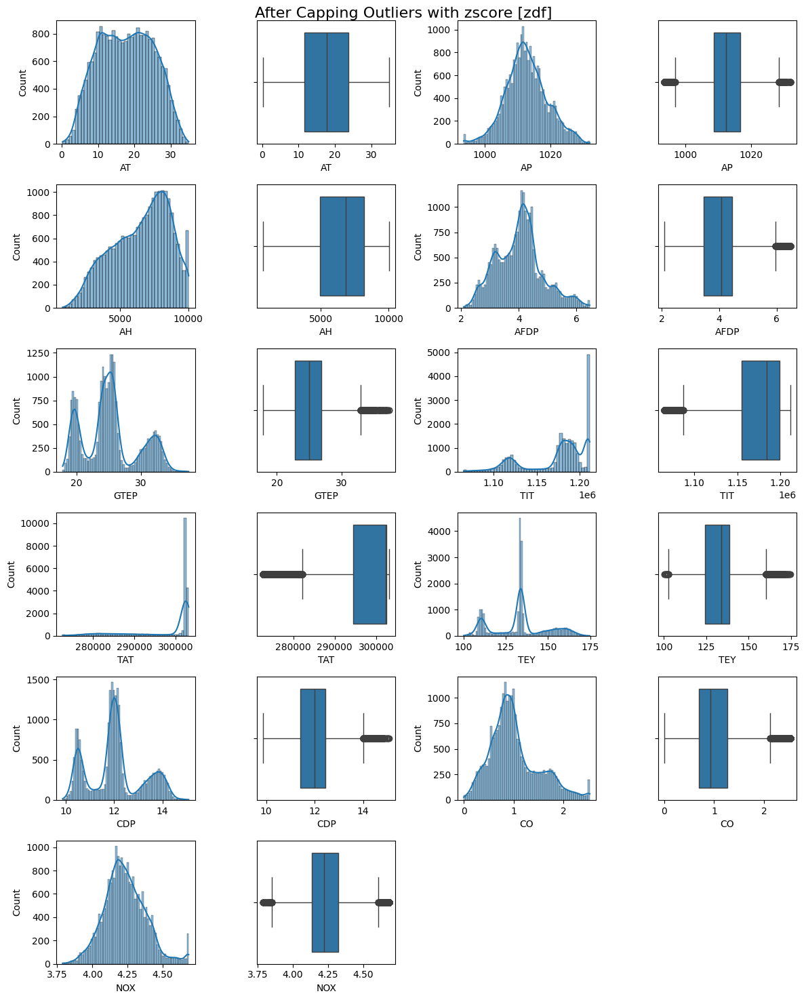

In [ ]:
column_names = zdf.columns.tolist()
index = 0
plt.figure(figsize=(12,15))
plt.suptitle("After Capping Outliers with zscore [zdf]", fontsize = 16)
for col in column_names:
    index+=1
    plt.subplot(6,4,index)
    sns.histplot(x=zdf[col],kde=True)
    index+=1
    plt.subplot(6,4,index)
    sns.boxplot(x=zdf[col])
plt.tight_layout()
plt.show()

In [ ]:
zdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22191 entries, 0 to 22190
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      22191 non-null  float64
 1   AP      22191 non-null  float64
 2   AH      22191 non-null  float64
 3   AFDP    22191 non-null  float64
 4   GTEP    22191 non-null  float64
 5   TIT     22191 non-null  float64
 6   TAT     22191 non-null  float64
 7   TEY     22191 non-null  float64
 8   CDP     22191 non-null  float64
 9   CO      22191 non-null  float64
 10  NOX     22191 non-null  float64
dtypes: float64(11)
memory usage: 1.9 MB


#### Cap outliers with IQR methode and make a new df 'IQRdf'

In [ ]:
IQRdf = df.copy() # make a df copy to make outlier capped df with IQR methode
column_names = IQRdf.columns.tolist()
for col in column_names:
    Q1 = IQRdf[col].quantile(0.25)
    Q3 = IQRdf[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    IQRdf[col] = np.where(IQRdf[col] < lower_bound, lower_bound, np.where(IQRdf[col] > upper_bound, upper_bound, IQRdf[col]))

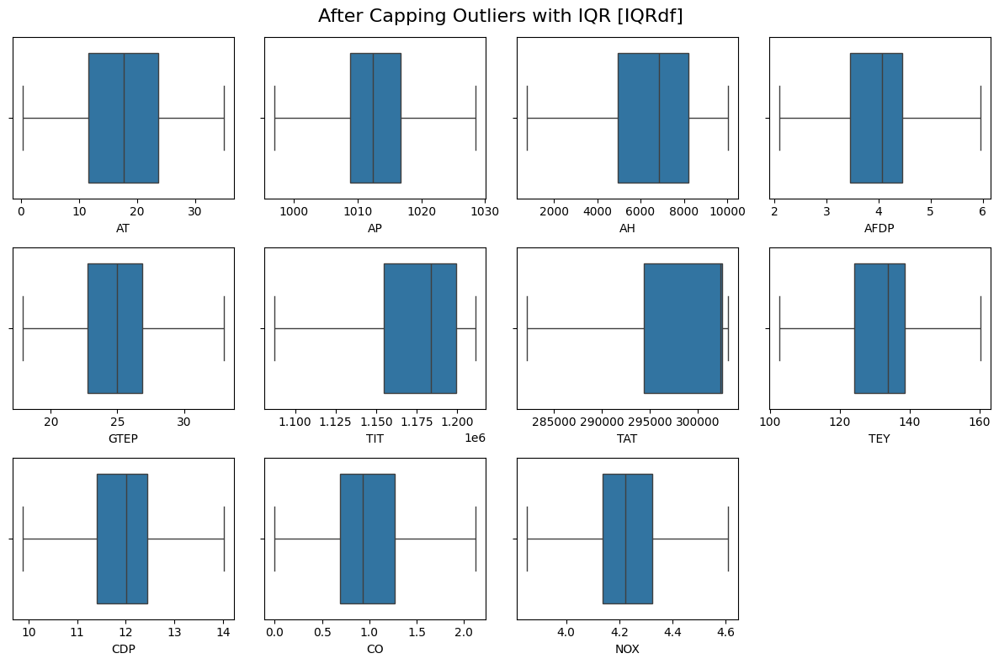

In [ ]:
# check outliers after capping with IQR
column_names = IQRdf.columns.tolist()
index = 0
plt.figure(figsize=(12,8))
plt.suptitle("After Capping Outliers with IQR [IQRdf]", fontsize = 16)
for col in column_names:
    index+=1
    plt.subplot(3,4,index)
    sns.boxplot(x=IQRdf[col])
plt.tight_layout()
plt.show()

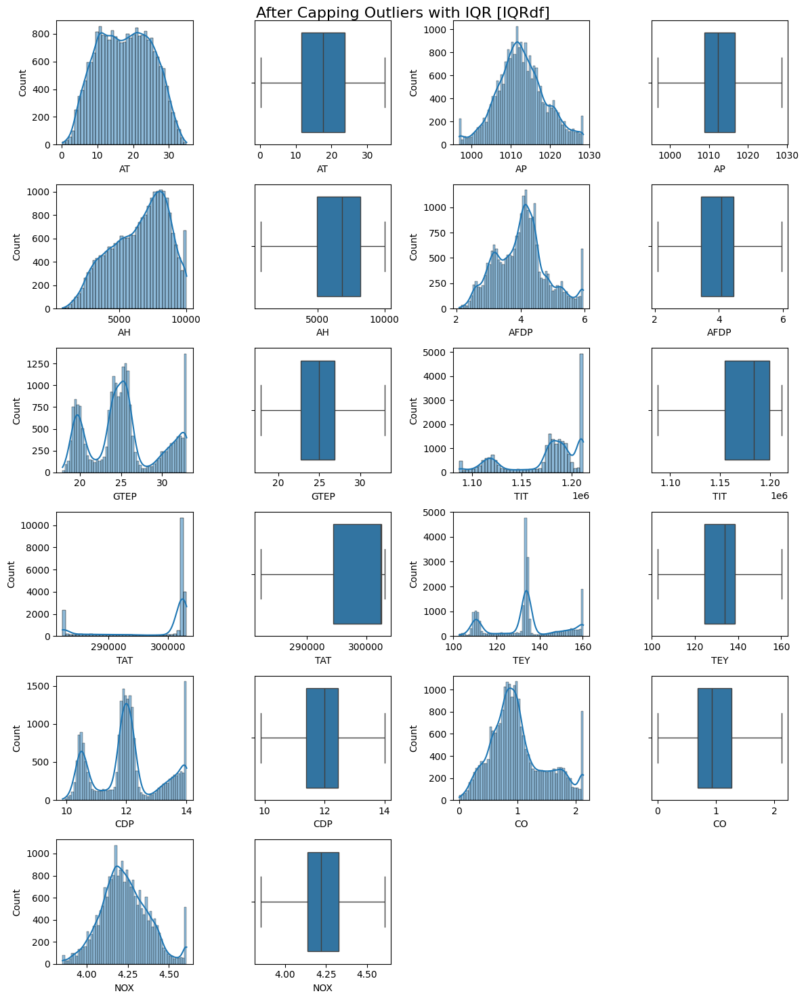

In [ ]:
column_names = IQRdf.columns.tolist()
index = 0
plt.figure(figsize=(12,15))
plt.suptitle("After Capping Outliers with IQR [IQRdf]", fontsize = 16)
for col in column_names:
    index+=1
    plt.subplot(6,4,index)
    sns.histplot(x=IQRdf[col],kde=True)
    index+=1
    plt.subplot(6,4,index)
    sns.boxplot(x=IQRdf[col])
plt.tight_layout()
plt.show()

### Scale features

In [ ]:

scalar = StandardScaler()
zx = zdf.drop('TEY',axis=1)
zy = zdf['TEY']
IQRx = IQRdf.drop('TEY',axis=1)
IQRy = IQRdf['TEY']
scaled_zdf_x = scalar.fit_transform(zx)
scaled_IQRdf_x = scalar.fit_transform(IQRx)

In [ ]:
scaled_zdf = pd.DataFrame(scaled_zdf_x,columns=zx.columns)
scaled_zdf['TEY'] = zy
scaled_IQRdf = pd.DataFrame(scaled_IQRdf_x,columns=IQRx.columns)
scaled_IQRdf['TEY'] = IQRy

In [ ]:
scaled_zdf.head()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,CDP,CO,NOX,TEY
0,-1.785002,0.924474,0.229520,-0.570927,-0.316215,0.178754,0.561762,-0.145577,-1.479829,1.241323,134.67
1,-1.825069,0.861559,0.274589,-0.576992,-0.322828,0.172730,0.591018,-0.150962,-1.303674,1.275581,134.67
2,-1.877935,0.877288,0.325082,-0.562263,-0.313617,0.196830,0.609641,-0.016341,-1.298670,1.387129,135.10
3,-1.899818,0.861559,0.372097,-0.564738,-0.332276,0.196830,0.606980,-0.063009,-1.630452,1.285864,135.03
4,-1.898730,0.782917,0.351489,-0.568080,-0.330859,0.160684,0.584367,-0.134807,-1.571743,1.247462,134.67


In [ ]:
scaled_zdf.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,CDP,CO,NOX,TEY
count,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,22191.000000
mean,-5.123106e-17,2.894555e-15,1.114275e-16,3.381250e-16,-1.460085e-16,-7.889583e-16,1.869934e-15,1.152699e-15,-1.229545e-16,-4.267547e-15,133.537393
std,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,16.026107
min,-2.369548e+00,-3.012384e+00,-2.763796e+00,-2.413241e+00,-1.757152e+00,-3.005029e+00,-3.018223e+00,-1.960806e+00,-2.048516e+00,-2.979170e+00,100.170000
25%,-8.225291e-01,-6.326534e-01,-7.579522e-01,-7.268256e-01,-6.097876e-01,-5.163495e-01,-3.931834e-01,-5.970058e-01,-6.574075e-01,-6.513006e-01,124.260000
50%,3.638600e-03,-6.642539e-02,1.581925e-01,3.929933e-02,-7.767323e-02,2.933190e-01,5.710691e-01,-5.313727e-02,-1.837435e-01,-8.159729e-02,133.770000
75%,8.085214e-01,6.099026e-01,8.020748e-01,5.128746e-01,3.592605e-01,7.292754e-01,5.910176e-01,3.439945e-01,4.990329e-01,6.167029e-01,138.645000
max,2.341580e+00,3.016372e+00,1.685923e+00,3.008737e+00,2.854034e+00,1.064235e+00,6.655401e-01,2.711079e+00,3.042766e+00,3.037461e+00,174.610000


In [ ]:
scaled_IQRdf.head()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,CDP,CO,NOX,TEY
0,-1.785002,0.933804,0.229520,-0.573597,-0.313416,0.175741,0.576097,-0.138798,-1.522521,1.278541,134.67
1,-1.825069,0.870159,0.274589,-0.579749,-0.320133,0.169627,0.608517,-0.144281,-1.339498,1.313614,134.67
2,-1.877935,0.886070,0.325082,-0.564809,-0.310778,0.194088,0.629155,-0.007200,-1.334300,1.427816,135.10
3,-1.899818,0.870159,0.372097,-0.567320,-0.329727,0.194088,0.626206,-0.054721,-1.679016,1.324142,135.03
4,-1.898730,0.790603,0.351489,-0.570709,-0.328288,0.157400,0.601148,-0.127831,-1.618018,1.284826,134.67


In [ ]:
scaled_IQRdf.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,CDP,CO,NOX,TEY
count,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,2.219100e+04,22191.000000
mean,-5.123106e-17,4.170208e-15,1.114275e-16,-2.766477e-16,2.766477e-16,-8.401893e-16,2.356629e-16,2.202935e-16,1.024621e-16,3.355634e-15,133.284632
std,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,1.000023e+00,15.548894
min,-2.369548e+00,-2.526873e+00,-2.763796e+00,-2.442186e+00,-1.776838e+00,-2.426195e+00,-2.118087e+00,-1.987194e+00,-2.113376e+00,-2.606348e+00,102.682500
25%,-8.225291e-01,-6.414010e-01,-7.579522e-01,-7.317189e-01,-6.115697e-01,-5.297734e-01,-4.821245e-01,-5.984749e-01,-6.680393e-01,-6.591009e-01,124.260000
50%,3.638600e-03,-6.859931e-02,1.581925e-01,4.533227e-02,-7.115186e-02,2.920218e-01,5.864113e-01,-4.466888e-02,-1.759108e-01,-7.584656e-02,133.770000
75%,8.085214e-01,6.155805e-01,8.020748e-01,5.256615e-01,3.726001e-01,7.345077e-01,6.085172e-01,3.597192e-01,5.334818e-01,6.390636e-01,138.645000
max,2.341580e+00,2.501053e+00,1.685923e+00,2.411732e+00,1.848855e+00,1.074484e+00,6.910993e-01,1.797010e+00,2.335764e+00,2.586310e+00,160.222500


In [ ]:
scaled_zdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22191 entries, 0 to 22190
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      22191 non-null  float64
 1   AP      22191 non-null  float64
 2   AH      22191 non-null  float64
 3   AFDP    22191 non-null  float64
 4   GTEP    22191 non-null  float64
 5   TIT     22191 non-null  float64
 6   TAT     22191 non-null  float64
 7   CDP     22191 non-null  float64
 8   CO      22191 non-null  float64
 9   NOX     22191 non-null  float64
 10  TEY     22191 non-null  float64
dtypes: float64(11)
memory usage: 1.9 MB


In [ ]:
scaled_IQRdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22191 entries, 0 to 22190
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      22191 non-null  float64
 1   AP      22191 non-null  float64
 2   AH      22191 non-null  float64
 3   AFDP    22191 non-null  float64
 4   GTEP    22191 non-null  float64
 5   TIT     22191 non-null  float64
 6   TAT     22191 non-null  float64
 7   CDP     22191 non-null  float64
 8   CO      22191 non-null  float64
 9   NOX     22191 non-null  float64
 10  TEY     22191 non-null  float64
dtypes: float64(11)
memory usage: 1.9 MB


<Figure size 1200x1200 with 0 Axes>

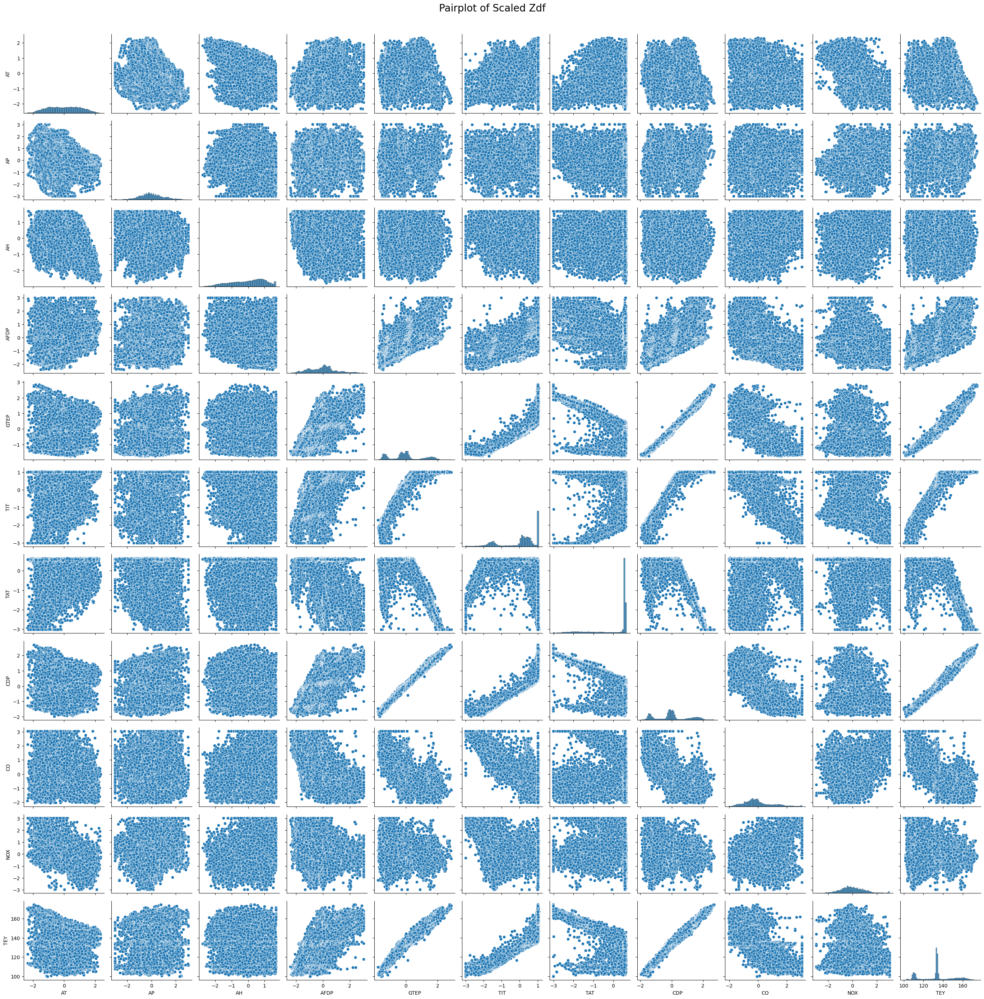

In [ ]:
plt.figure(figsize=(12,12))
g = sns.pairplot(scaled_zdf)
g._figure.suptitle('Pairplot of Scaled Zdf', fontsize=20, y=1.01)
plt.tight_layout()
plt.show()

<Figure size 1200x1200 with 0 Axes>

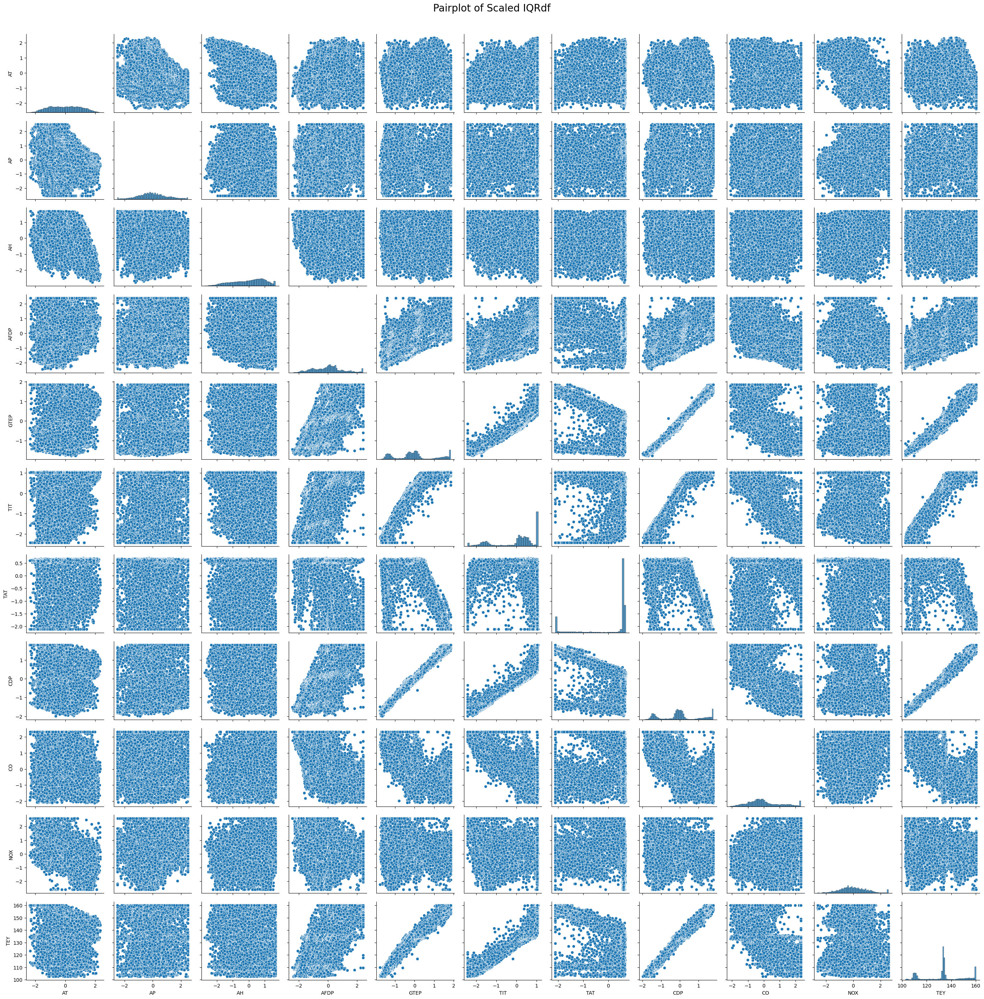

In [ ]:
plt.figure(figsize=(12,12))
g = sns.pairplot(scaled_IQRdf)
g._figure.suptitle('Pairplot of Scaled IQRdf', fontsize=20, y=1.01)
plt.tight_layout()
plt.show()

**Observations and Insights:**

* TEY and CDP (Compressor Discharge Pressure) have a strong positive linear correlation.
* TEY and GTEP (Gas Turbine Exhaust Pressure) have a strong positive linear correlation.
* Increases in CDP and GTEP suggest likely increases in TEY.
CDP and GTEP are likely to be strong predictors for TEY.

* TIT (Turbine Inlet Temperature) and GTEP (Gas Turbine Exhaust Pressure): notice a strong positive linear correlation between TIT and GTEP. This is expected as higher turbine inlet temperatures generally result in higher exhaust pressures.

In [ ]:
y_columns=[col for col in column_names if col != 'TEY' ]
y_columns

['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'CDP', 'CO', 'NOX']

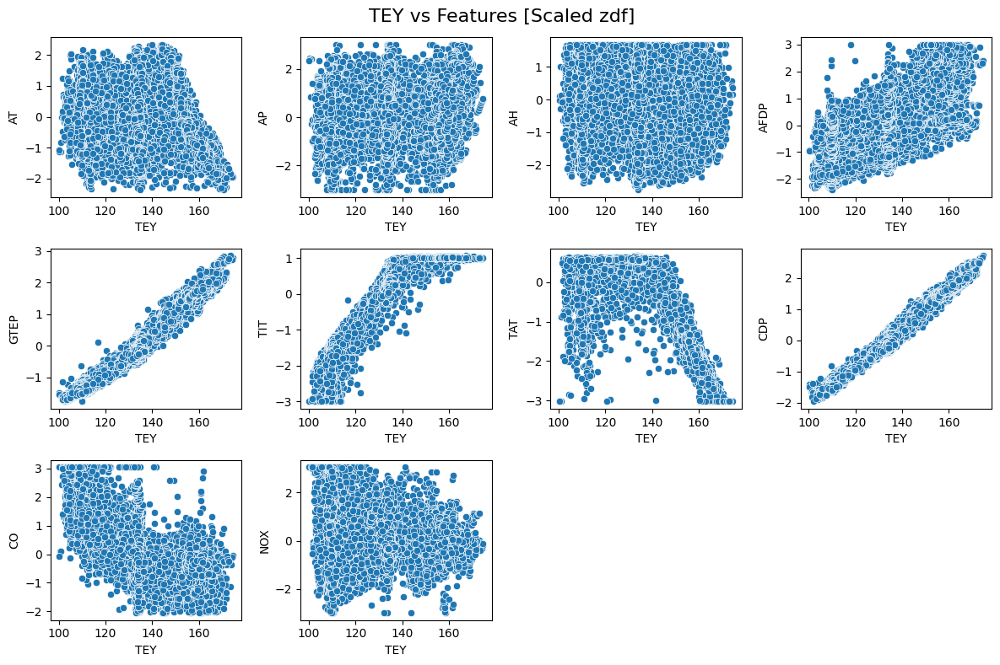

In [ ]:
plt.figure(figsize=(12,8))
plt.suptitle("TEY vs Features [Scaled zdf]", fontsize = 16)
index = 0
for col in y_columns:
    index+=1
    plt.subplot(3,4,index)
    sns.scatterplot(data=scaled_zdf , x='TEY', y=col)
plt.tight_layout()
plt.show()

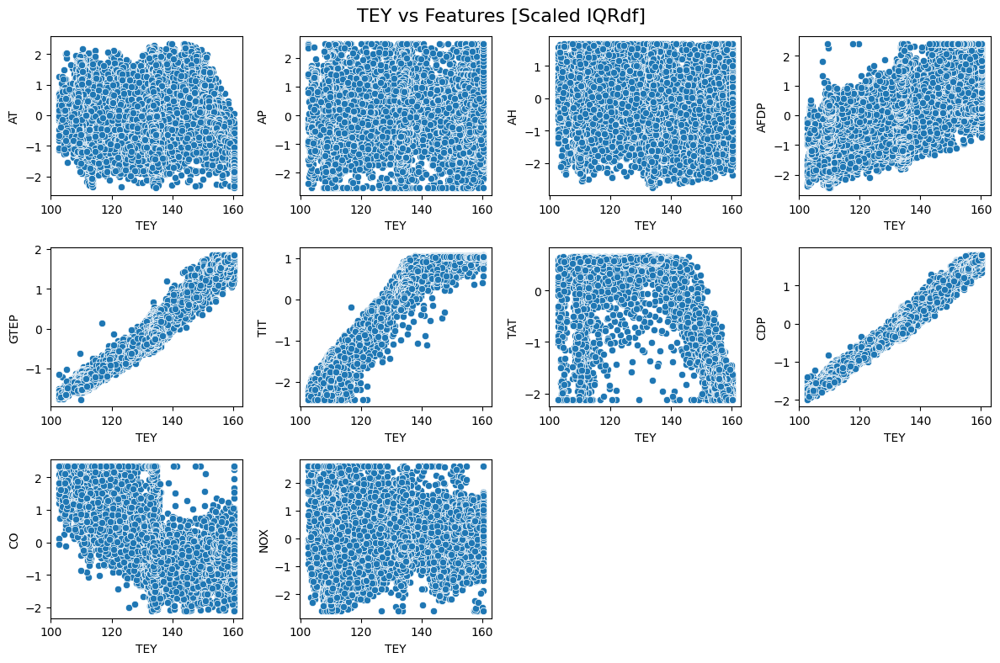

In [ ]:
plt.figure(figsize=(12,8))
plt.suptitle("TEY vs Features [Scaled IQRdf]", fontsize = 16)
index = 0
for col in y_columns:
    index+=1
    plt.subplot(3,4,index)
    sns.scatterplot(data=scaled_IQRdf , x='TEY', y=col)
plt.tight_layout()
plt.show()

**From the above analysis shows**
* TEY shows a strong positive correlation with GTEP, CDP, TIT.
* TEY shows a strong positive correlation with . This suggests that as CDP,GTEP,TIT increases, TEY tends to increase as well.
*  There might be a negative correlation between TEY and TAT and TEY and CO.
* Mild relationship between TEY and AFDP
* CDP , GTEP, TIT are better for predicting TEY

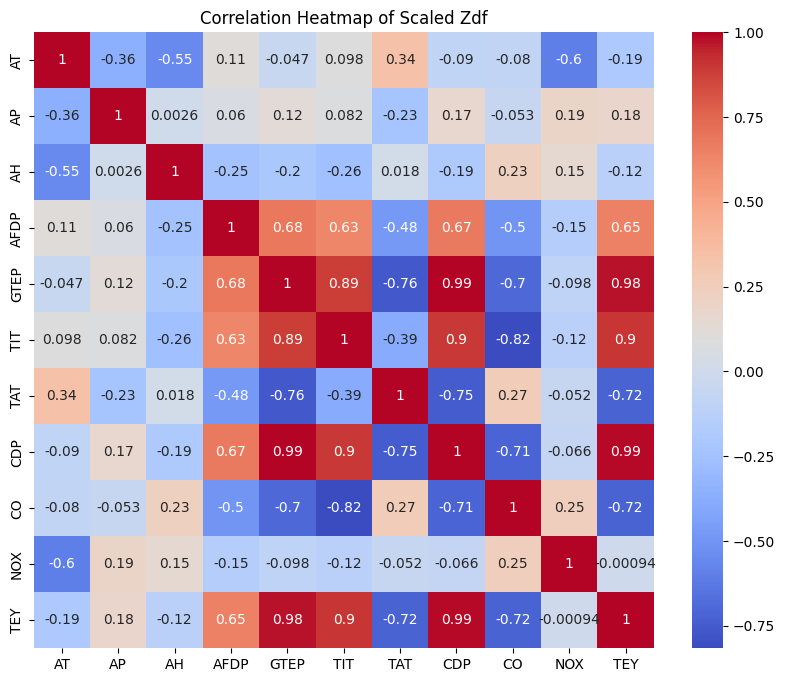

In [ ]:
plt.figure(figsize=(10,8))
sns.heatmap(scaled_zdf.corr(),annot=True,cmap='coolwarm')
plt.title('Correlation Heatmap of Scaled Zdf')
plt.show()

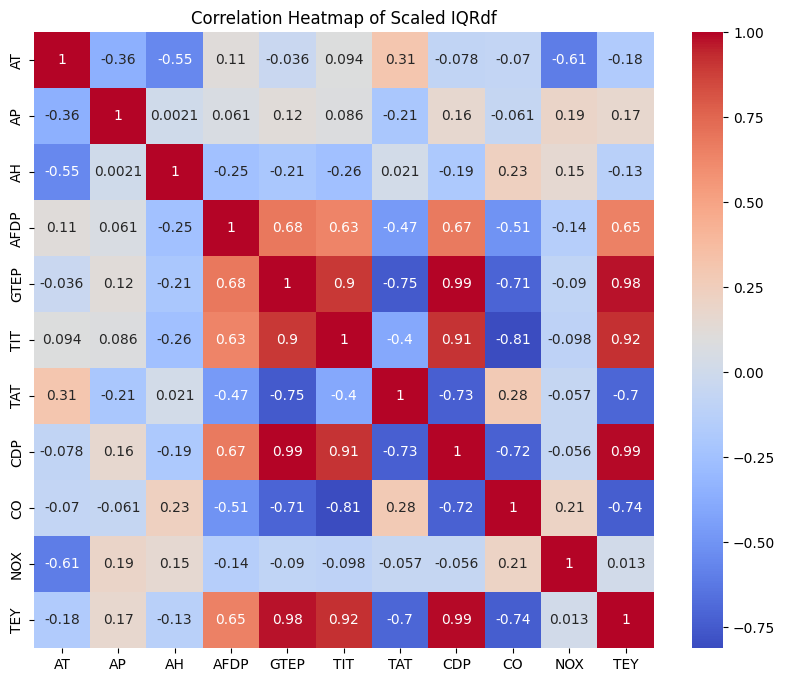

In [ ]:
plt.figure(figsize=(10,8))
sns.heatmap(scaled_IQRdf.corr(),annot=True,cmap='coolwarm')
plt.title('Correlation Heatmap of Scaled IQRdf')
plt.show()

####**Key Observations from the Heatmap:**

**Strong Positive Correlations with TEY:**

CDP, GTEP, TIT, and AFDP shows strong positive correlations with TEY. This indicates that as these variables increase, TEY tends to increase as well.

Strong Negative Correlations with TEY:

CO and TAT show strong negative correlations with TEY. This means that as CO and TAT increase, TEY tends to decrease.

**Other Relationships:**

AT and AH have moderate negative correlations with TEY.
AP has a weak Positive correlation with TEY.

## Select best features

The best features according to Correlation are CO,CDP,TAT,TIT,GTEP,AFDP

In [ ]:
# Selecting with SelectKbest on scaled_zdf
selector = SelectKBest(score_func=f_regression,k=6)
selector.fit(scaled_zdf.drop('TEY',axis=1),scaled_zdf['TEY'])
selected_features = scaled_zdf.drop('TEY',axis=1).columns[selector.get_support()]
selected_features

Index(['AFDP', 'GTEP', 'TIT', 'TAT', 'CDP', 'CO'], dtype='object')

In [ ]:
# Selecting with SelectKbest on iqr scaled_IQRdf
selector_iqr = SelectKBest(score_func=f_regression,k=6)
selector_iqr.fit(scaled_IQRdf.drop('TEY',axis=1),scaled_IQRdf['TEY'])
selected_features_iqr = scaled_IQRdf.drop('TEY',axis=1).columns[selector.get_support()]
selected_features_iqr

Index(['AFDP', 'GTEP', 'TIT', 'TAT', 'CDP', 'CO'], dtype='object')

The above method picked the best 6 features and they are ['AFDP', 'GTEP', 'TIT', 'TAT', 'CDP', 'CO']

### Check for Multicollinearity and optimize features

In [ ]:
def calculate_vif(X):
  vif = pd.DataFrame()
  vif["variables"] = X.columns
  vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
  return vif

|Variable (Abbr.)|
|----------------|
|Ambient temperature (AT)|
|Ambient pressure (AP)|
|Ambient humidity (AH)|
|Air filter difference pressure (AFDP)|
|Gas turbine exhaust pressure (GTEP)|
|Turbine inlet temperature (TIT)|
|Turbine after temperature (TAT)|
|Compressor discharge pressure (CDP)|
|Turbine energy yield (TEY) |
|Carbon monoxide (CO)|
|Nitrogen oxides (NOx)|

In [ ]:
print(calculate_vif(scaled_IQRdf[['AFDP', 'GTEP', 'TIT', 'TAT', 'CDP', 'CO']]))

  variables         VIF
0      AFDP    1.905997
1      GTEP  113.276086
2       TIT  103.997688
3       TAT   39.269290
4       CDP  208.362642
5        CO    2.976724


In [ ]:
print(calculate_vif(scaled_IQRdf[['AFDP', 'TIT', 'TAT', 'CDP', 'CO']]))

  variables         VIF
0      AFDP    1.847007
1       TIT   95.008624
2       TAT   34.295621
3       CDP  171.135179
4        CO    2.970900


In [ ]:
print(calculate_vif(scaled_IQRdf[['AFDP', 'TIT', 'TAT', 'CO']]))

  variables       VIF
0      AFDP  1.846644
1       TIT  3.761730
2       TAT  1.323947
3        CO  2.964476


In [ ]:
print(calculate_vif(scaled_IQRdf[['AFDP', 'TIT', 'CDP','CO']]))

  variables       VIF
0      AFDP  1.843043
1       TIT  8.408908
2       CDP  6.606498
3        CO  2.959940


According to the scatter plot the 'CDP' shows a strong linear relationship with the target variable 'TEY'so dropping won't be a good idea,  
so to minimize multicollinearity issues we dropped GTEP and TAT    
so the final selected x features are ['AFDP', 'TIT', 'CDP','CO']

* **Air Filter Differential Pressure (AFDP):** Indicates the state of the air filter, which affects turbine performance.

* **Turbine Inlet Temperature (TIT):** Strongly related to energy yield and reflects operational conditions.

* **Compressor Discharge Pressure (CDP):** Correlates with compressor performance, which influences turbine energy output.

* **Carbon Monoxide (CO):** Emission levels correlate with combustion efficiency, which impacts energy yield.


## Split the Data

In [ ]:
columns_to_drop = [col for col in scaled_zdf.columns if col not in ['AFDP', 'TIT', 'CDP','CO']]
columns_to_drop

['AT', 'AP', 'AH', 'GTEP', 'TAT', 'NOX', 'TEY']

In [ ]:
# train set
x_train_zdf = scaled_zdf.drop(columns_to_drop,axis=1)
y_train_zdf = scaled_zdf['TEY']
x_train_IQRdf = scaled_IQRdf.drop(columns_to_drop,axis=1)
y_train_IQRdf = scaled_IQRdf['TEY']

In [ ]:
# test set final
test_df = test_df.drop(['AT', 'AP', 'AH', 'GTEP', 'TAT', 'NOX'],axis=1)
test_df

,AFDP,TIT,TEY,CDP,CO
0,3.2422,1067.5,126.16,11.381,1.9157
1,3.2074,1067.9,126.51,11.476,2.0596
2,3.2051,1068.5,126.96,11.555,2.1621
3,3.2159,1069.6,127.83,11.539,2.1214
4,3.1898,1068.1,126.56,11.484,2.1549
...,...,...,...,...,...
14530,3.1661,1037.0,109.08,10.411,10.9930
14531,3.1923,1037.6,108.79,10.344,11.1440
14532,3.3128,1038.0,107.81,10.462,11.4140
14533,3.9831,1076.9,131.41,11.771,3.3134


####applying the same preprosessing steps on the test data

In [ ]:
# transform
test_df['TIT'] = np.square(test_df['TIT'])
test_df['CO'] = np.log1p(test_df['CO'])


In [ ]:
test_zdf = test_df.copy() # make a df copy to make outlier capped df with z score methode
column_names = test_zdf.columns.tolist()
for col in column_names:               # loop through every column in x_test_zdf
    z_score = zscore(test_zdf[col])         # calculate the Z-score for the column
    outlier_mask = np.abs(z_score) > 3 # make mask of outliers
    upper_bound = test_zdf[col][~outlier_mask].max() # invert the mask and get the max of non outlier value
    lower_bound = test_zdf[col][~outlier_mask].min() # invert the mask and get the min of non outlier value
    test_zdf[col] = np.where(z_score > 3, upper_bound, np.where(z_score < -3, lower_bound, test_zdf[col])) # cap the outlier values

In [ ]:
test_iqrdf = test_df.copy() # make a df copy to make outlier capped df with IQR methode
column_names = test_iqrdf.columns.tolist()
for col in column_names:
    Q1 = test_iqrdf[col].quantile(0.25)
    Q3 = test_iqrdf[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    test_iqrdf[col] = np.where(test_iqrdf[col] < lower_bound, lower_bound, np.where(test_iqrdf[col] > upper_bound, upper_bound, test_iqrdf[col]))

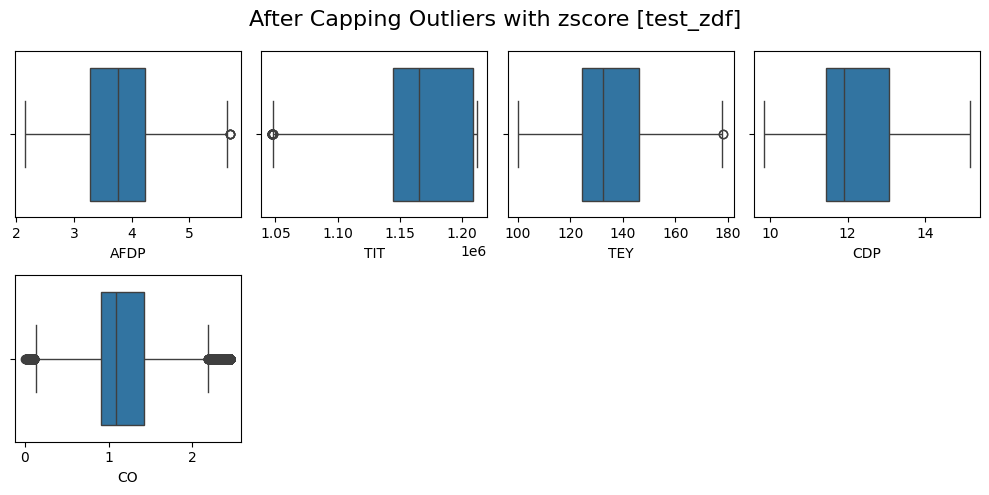

In [ ]:
index=0
plt.figure(figsize=(10,5))
for col in column_names:
    index+=1
    plt.subplot(2,4,index)
    sns.boxplot(x=test_zdf[col])
plt.suptitle("After Capping Outliers with zscore [test_zdf]", fontsize = 16)
plt.tight_layout()
plt.show()

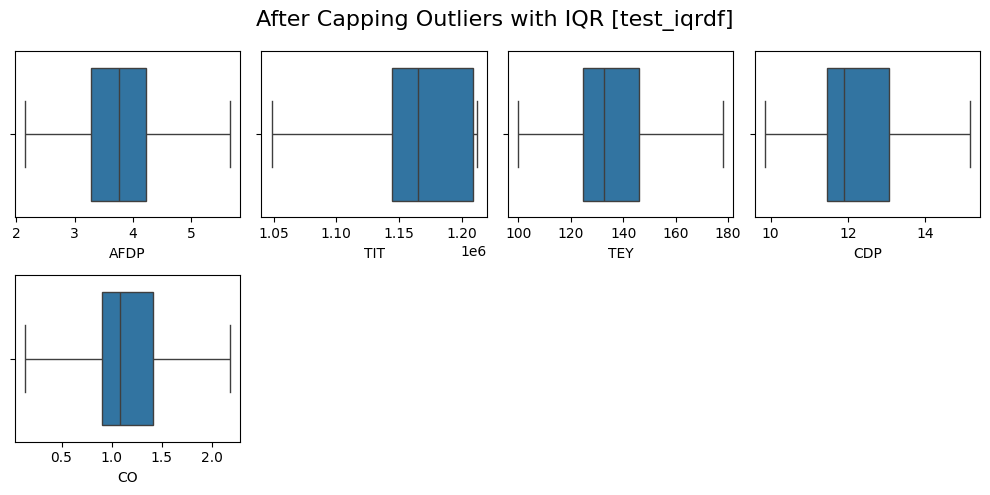

In [ ]:
index=0
plt.figure(figsize=(10,5))
for col in column_names:
    index+=1
    plt.subplot(2,4,index)
    sns.boxplot(x=test_iqrdf[col])
plt.suptitle("After Capping Outliers with IQR [test_iqrdf]", fontsize = 16)
plt.tight_layout()
plt.show()

In [ ]:
# scale
test_scalar = StandardScaler()
test_zdf_x = test_zdf.drop('TEY',axis=1)
test_iqrdf_x = test_iqrdf.drop('TEY',axis=1)
test_scaled_zdf_x = test_scalar.fit_transform(test_zdf_x)
test_scaled_IQRdf_x = test_scalar.fit_transform(test_iqrdf_x)
x_test_iqrdf = pd.DataFrame(test_scaled_IQRdf_x,columns=test_iqrdf_x.columns)
x_test_zdf = pd.DataFrame(test_scaled_zdf_x,columns=test_zdf_x.columns)

In [ ]:
x_test_zdf

,AFDP,TIT,CDP,CO
0,-0.752957,-0.635293,-0.648180,-0.254602
1,-0.804188,-0.613444,-0.557608,-0.137714
2,-0.807574,-0.580655,-0.482291,-0.057760
3,-0.791675,-0.520494,-0.497545,-0.089193
4,-0.830098,-0.602516,-0.549981,-0.063291
...,...,...,...,...
14530,-0.864989,-2.277169,-1.572966,3.101589
14531,-0.826418,-2.245329,-1.636843,3.101589
14532,-0.649021,-2.224092,-1.524344,3.101589
14533,0.337773,-0.119678,-0.276359,0.695601


In [ ]:
x_test_iqrdf

,AFDP,TIT,CDP,CO
0,-0.752988,-0.635560,-0.648180,-0.252161
1,-0.804224,-0.613705,-0.557608,-0.130856
2,-0.807610,-0.580907,-0.482291,-0.047881
3,-0.791709,-0.520730,-0.497545,-0.080501
4,-0.830136,-0.602774,-0.549981,-0.053621
...,...,...,...,...
14530,-0.865029,-2.277888,-1.572966,2.553368
14531,-0.826455,-2.246039,-1.636843,2.553368
14532,-0.649045,-2.224796,-1.524344,2.553368
14533,0.337827,-0.119803,-0.276359,0.733949


In [ ]:
x_train_zdf.head()

,AFDP,TIT,CDP,CO
0,-0.570927,0.178754,-0.145577,-1.479829
1,-0.576992,0.172730,-0.150962,-1.303674
2,-0.562263,0.196830,-0.016341,-1.298670
3,-0.564738,0.196830,-0.063009,-1.630452
4,-0.568080,0.160684,-0.134807,-1.571743


In [ ]:
x_train_IQRdf.head()

,AFDP,TIT,CDP,CO
0,-0.573597,0.175741,-0.138798,-1.522521
1,-0.579749,0.169627,-0.144281,-1.339498
2,-0.564809,0.194088,-0.007200,-1.334300
3,-0.567320,0.194088,-0.054721,-1.679016
4,-0.570709,0.157400,-0.127831,-1.618018


In [ ]:
x_train_zdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22191 entries, 0 to 22190
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AFDP    22191 non-null  float64
 1   TIT     22191 non-null  float64
 2   CDP     22191 non-null  float64
 3   CO      22191 non-null  float64
dtypes: float64(4)
memory usage: 693.6 KB


In [ ]:
x_train_IQRdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22191 entries, 0 to 22190
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AFDP    22191 non-null  float64
 1   TIT     22191 non-null  float64
 2   CDP     22191 non-null  float64
 3   CO      22191 non-null  float64
dtypes: float64(4)
memory usage: 693.6 KB


In [ ]:
y_train_zdf.head()

,TEY
0,134.67
1,134.67
2,135.10
3,135.03
4,134.67


In [ ]:
y_train_IQRdf.head()

,TEY
0,134.67
1,134.67
2,135.10
3,135.03
4,134.67


In [ ]:
y_train_zdf.info()

<class 'pandas.core.series.Series'>
RangeIndex: 22191 entries, 0 to 22190
Series name: TEY
Non-Null Count  Dtype  
--------------  -----  
22191 non-null  float64
dtypes: float64(1)
memory usage: 173.5 KB


In [ ]:
y_train_IQRdf.info()

<class 'pandas.core.series.Series'>
RangeIndex: 22191 entries, 0 to 22190
Series name: TEY
Non-Null Count  Dtype  
--------------  -----  
22191 non-null  float64
dtypes: float64(1)
memory usage: 173.5 KB


## Model Implementation

**Implementing five regression algorithms:**

Linear Regression

Decision Tree Regressor

Random Forest Regressor

Gradient Boosting Regressor

Support Vector Regressor

#### Import Modules

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

#### Fit models with scaled_IQRdf dataset

In [ ]:
x_train = x_train_IQRdf
y_train = y_train_IQRdf

# Create dictionary to store the models
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree Regressor': DecisionTreeRegressor(),
    'Random Forest Regressor': RandomForestRegressor(),
    'Gradient Boosting Regressor': GradientBoostingRegressor(),
    'Support Vector Regressor': SVR()
}

# loop through model dictionary and train each
for model_name, model in models.items():
    model.fit(x_train, y_train)
    print(f'Trained {model_name} Model')

Trained Linear Regression Model
Trained Decision Tree Regressor Model
Trained Random Forest Regressor Model
Trained Gradient Boosting Regressor Model
Trained Support Vector Regressor Model


## Model Evaluation

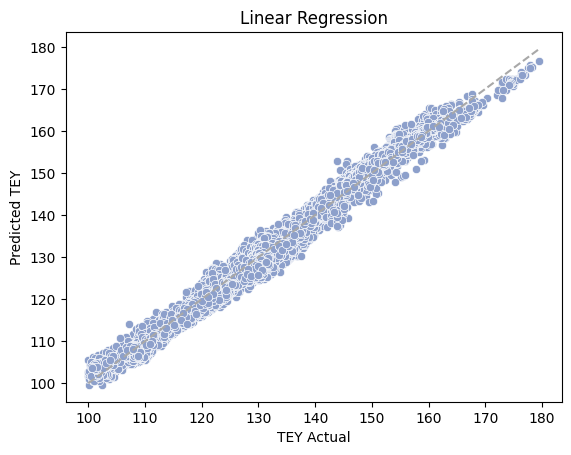

Linear Regression :   MSE:4.55569039559205      MAE:1.7751027233217025      R2:0.9796916129735478
----------------------------------------------------------------------------------------------------


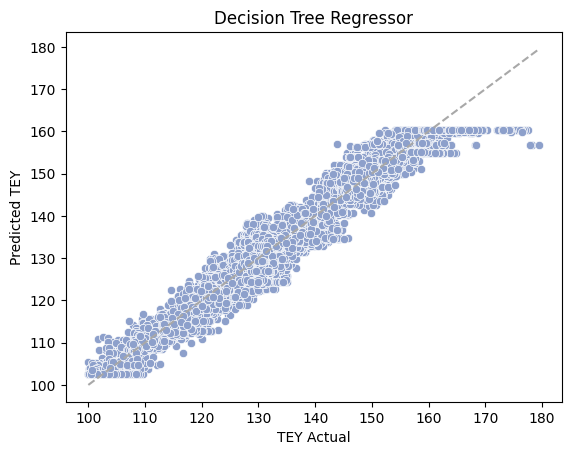

Decision Tree Regressor :   MSE:10.725718857499153      MAE:2.523635534915722      R2:0.9521868189493808
----------------------------------------------------------------------------------------------------


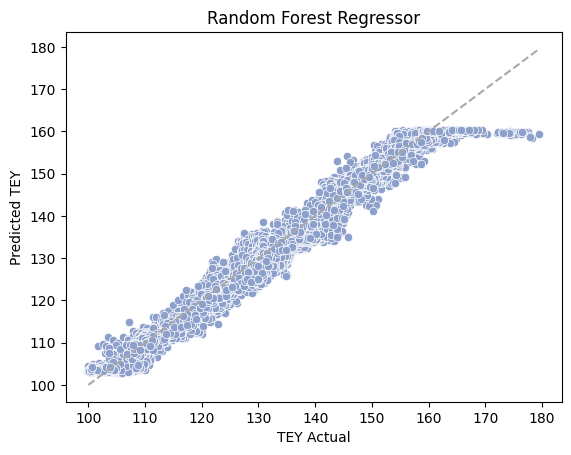

Random Forest Regressor :   MSE:7.386227594196675      MAE:2.063497291021675      R2:0.9670736253733254
----------------------------------------------------------------------------------------------------


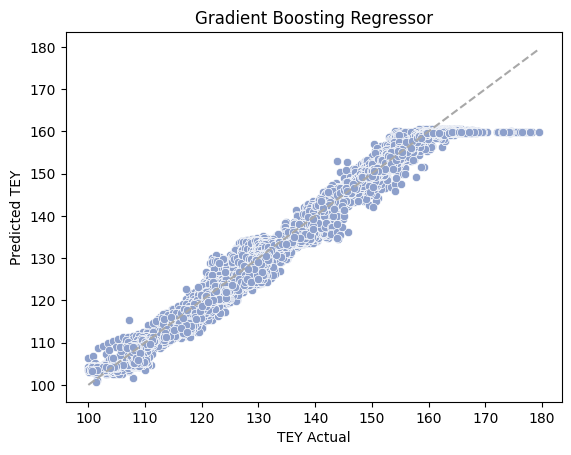

Gradient Boosting Regressor :   MSE:6.626804458155037      MAE:1.9395494346618594      R2:0.9704589868936119
----------------------------------------------------------------------------------------------------


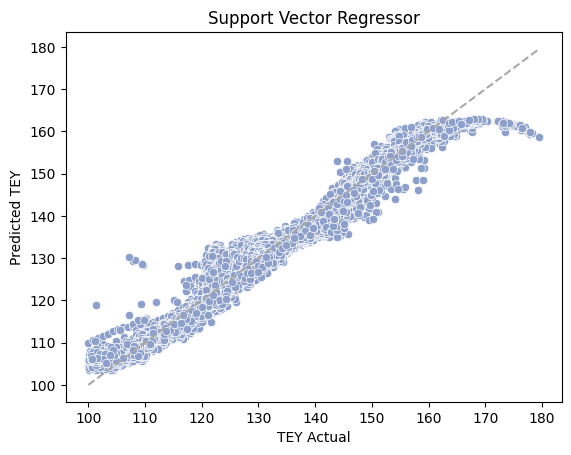

Support Vector Regressor :   MSE:7.687304994466823      MAE:2.021176430846663      R2:0.9657314805305767
----------------------------------------------------------------------------------------------------


In [ ]:
x_test = x_test_iqrdf
y_test = test_df['TEY']
# Loop through model dictionary and evaluate each
for model_name, model in models.items():
    y_pred = model.predict(x_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    plt.title(model_name)
    sns.scatterplot(x=y_test, y=y_pred , color='#8da0cb')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='#a8a8a8')
    plt.xlabel('TEY Actual')
    plt.ylabel('Predicted TEY')
    plt.show()
    print(f'{model_name} :   MSE:{mse}      MAE:{mae}      R2:{r2}')
    print('-'*100)

#### Fit models with scaled_zdf dataset

In [ ]:
x_train = x_train_zdf
y_train = y_train_zdf

# Create dictionary to store the models
zmodels = {
    'Linear Regression': LinearRegression(),
    'Decision Tree Regressor': DecisionTreeRegressor(),
    'Random Forest Regressor': RandomForestRegressor(),
    'Gradient Boosting Regressor': GradientBoostingRegressor(),
    'Support Vector Regressor': SVR()
}

# loop through model dictionary and train each
for zmodel_name, zmodel in zmodels.items():
    zmodel.fit(x_train, y_train)
    print(f'Trained {zmodel_name} Model')

Trained Linear Regression Model
Trained Decision Tree Regressor Model
Trained Random Forest Regressor Model
Trained Gradient Boosting Regressor Model
Trained Support Vector Regressor Model


## Model Evaluation

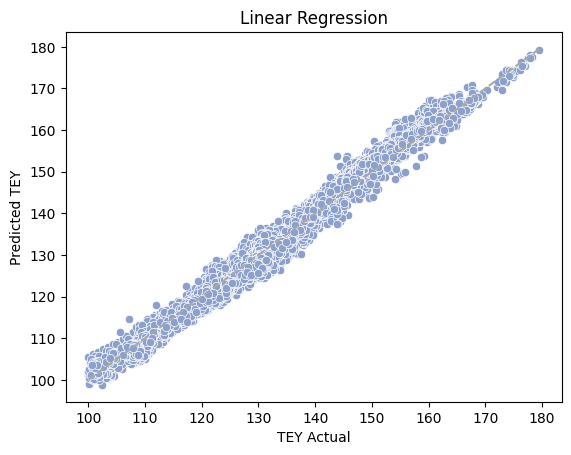

Linear Regression :   MSE:5.2119952590594405      MAE:1.9165781599937561      R2:0.9767659327764179
----------------------------------------------------------------------------------------------------


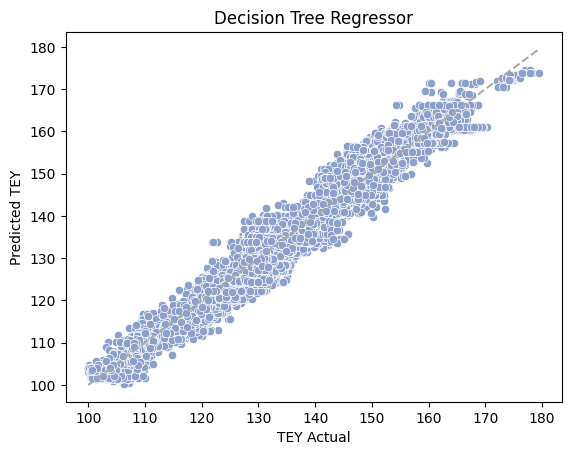

Decision Tree Regressor :   MSE:10.272343584451322      MAE:2.5071523907808735      R2:0.9542078782650418
----------------------------------------------------------------------------------------------------


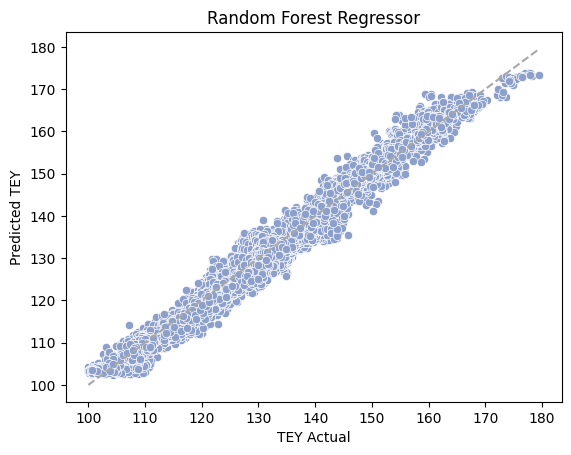

Random Forest Regressor :   MSE:6.479386015498441      MAE:2.0084990918472636      R2:0.9711161498103903
----------------------------------------------------------------------------------------------------


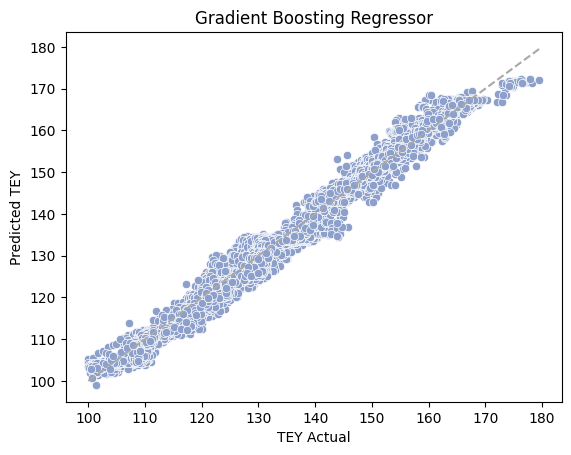

Gradient Boosting Regressor :   MSE:5.644392803464069      MAE:1.8679054205707761      R2:0.9748383881193987
----------------------------------------------------------------------------------------------------


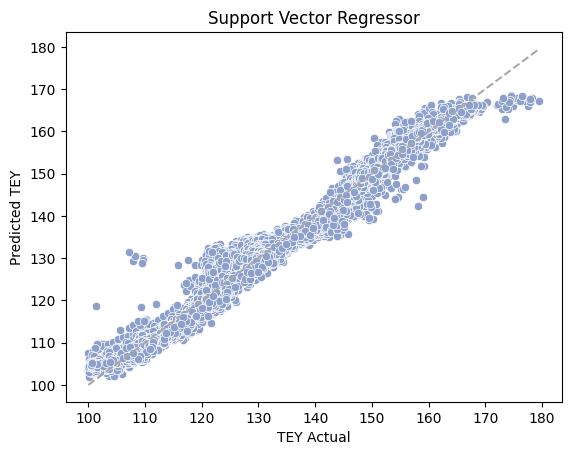

Support Vector Regressor :   MSE:7.119972313715762      MAE:1.967817712578335      R2:0.9682605399382561
----------------------------------------------------------------------------------------------------


In [ ]:
x_test = x_test_zdf
y_test = test_df['TEY']
# Loop through model dictionary and evaluate each
for zmodel_name, zmodel in zmodels.items():
    y_pred = zmodel.predict(x_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    plt.title(zmodel_name)
    sns.scatterplot(x=y_test, y=y_pred , color='#8da0cb')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='#a8a8a8')
    plt.xlabel('TEY Actual')
    plt.ylabel('Predicted TEY')
    plt.show()
    print(f'{zmodel_name} :   MSE:{mse}      MAE:{mae}      R2:{r2}')
    print('-'*100)

##Model Evaluation Summary:
**Trained on IQR Dataset:**

* Linear Regression has the lowest MSE (4.56) and MAE (1.78), with the highest R² (0.98).

* Gradient Boosting Regressor comes second, with an MSE of 6.63, MAE of 1.94, and R² of 0.97.

* Random Forest Regressor performs slightly worse than Gradient Boosting but better than others with an MSE of 7.44, MAE of 2.07, and R² of 0.97.

**Trained on Z-Score Dataset:**

* Random Forest Regressor has the lowest MSE (6.51) and high R² (0.971), but its MAE (2.02) is not the best.

* Gradient Boosting Regressor performs almost as well, with a slightly higher MSE (5.64) but a better MAE (1.87) and an R² of 0.975.

* Linear Regression has a slightly higher MSE (5.21) than Gradient Boosting but worse MAE (1.92) and lower R² (0.977).

**Best model:**

The Linear Regression trained on the IQR dataset is the best overall model:

Lowest MSE: 4.56

Lowest MAE: 1.78

Highest R²: 0.98

This indicates it captures the data variability better and has the least prediction error across the board.

##Linear Regression The Best Model Pipeline

In [ ]:
# Function for outlier capping with IQR
def cap_outliers_iqr(X):
    X = pd.DataFrame(X) # Convert the input to a pandas DataFrame if it's not already
    X.columns = ['AFDP', 'TIT', 'CDP', 'CO']  # Set the column names for the DataFrame
    for col in X.columns:
        Q1 = X[col].quantile(0.25)
        Q3 = X[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        X[col] = np.where(X[col] < lower_bound, lower_bound, np.where(X[col] > upper_bound, upper_bound, X[col]))
    return X.to_numpy() # Convert the DataFrame back to a NumPy array before returning

# Function to apply square transformation to specific columns
def square_transform(X):
    X_df = pd.DataFrame(X, columns=['AFDP', 'TIT', 'CDP', 'CO']) # New DataFrame with column names
    X_df['TIT'] = np.square(X_df['TIT']) # Transformation on new DataFrame
    return X_df.to_numpy() # Convert back to numpy array

# Function to apply log1p transformation to specific columns
def log1p_transform(X):
    X_df = pd.DataFrame(X, columns=['AFDP', 'TIT', 'CDP', 'CO']) # New DataFrame with column names
    X_df['CO'] = np.log1p(X_df['CO']) # Transformation on new DataFrame
    return X_df.to_numpy() # Convert back to numpy array

In [ ]:
# Define column transformer for preprocessing
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline([
            ('imputer', SimpleImputer(strategy='mean')),
            ('square_transform', FunctionTransformer(square_transform)),
            ('log1p_transform', FunctionTransformer(log1p_transform)),
            ('outlier_capping', FunctionTransformer(cap_outliers_iqr)),
            ('scaler', StandardScaler()),
        ]), ['AFDP', 'TIT', 'CDP', 'CO']),
    ],
    remainder='drop'  # Drop other columns
)

# Create the final pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression()),
])

In [ ]:
x_train = train_dataset_for_pipeline.drop('TEY',axis=1)
y_train = train_dataset_for_pipeline['TEY']

In [ ]:
x_train

,AT,AP,AH,AFDP,GTEP,TIT,TAT,CDP,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,11.990,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,11.910,0.26747,82.028
...,...,...,...,...,...,...,...,...,...,...
22186,4.8631,1027.0,81.084,4.2825,34.045,1100.0,529.98,14.290,1.25380,78.397
22187,4.5173,1027.4,80.813,4.2481,33.904,1100.1,530.47,14.344,1.08080,78.251
22188,4.2717,1027.9,80.380,4.2817,34.165,1099.9,529.56,14.395,1.04720,77.269
22189,4.0853,1028.6,78.907,4.2313,33.802,1100.1,530.61,14.343,1.08750,77.985


In [ ]:
y_train

,TEY
0,134.67
1,134.67
2,135.10
3,135.03
4,134.67
...,...
22186,168.38
22187,168.07
22188,168.55
22189,167.98


In [ ]:
pipeline.fit(x_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('square_transform',
                                                                   FunctionTransformer(func=<function square_transform at 0x7d5e0b220b80>)),
                                                                  ('log1p_transform',
                                                                   FunctionTransformer(func=<function log1p_transform at 0x7d5e0b220280>)),
                                                                  ('outlier_capping',
                                                                   FunctionTransformer(func=<function cap_outliers_iqr at 0x7d5e0b220820>)),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['AFDP', 'TIT', 'CDP',
                                                   'CO'])])),
                ('regressor', LinearRegression())])

In [ ]:
x_test = test_dataset_for_pipeline.drop('TEY',axis=1)
y_test = test_dataset_for_pipeline['TEY']
# Make predictions on test dataset
y_pred = pipeline.predict(x_test)

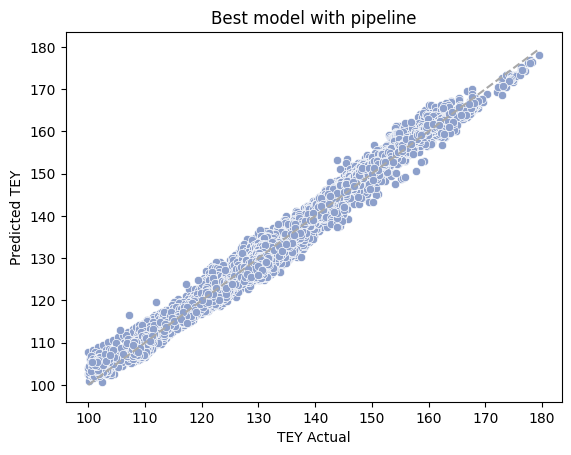

Best model with pipeline :   MSE:4.640150196577871      MAE:1.7801096530275642      R2:0.9793092627915607
----------------------------------------------------------------------------------------------------


In [ ]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
plt.title('Best model with pipeline')
sns.scatterplot(x=y_test, y=y_pred , color='#8da0cb')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='#a8a8a8')
plt.xlabel('TEY Actual')
plt.ylabel('Predicted TEY')
plt.show()
print(f'Best model with pipeline :   MSE:{mse}      MAE:{mae}      R2:{r2}')
print('-'*100)

##  Save the final model along with the preprocessing steps using a pipeline.


In [104]:
import pickle
with open('turbine_energy_yield_prediction_model_by_amn.pkl', 'wb') as file:
    pickle.dump(pipeline, file)

In [105]:
# download model file
from google.colab import files
files.download('turbine_energy_yield_prediction_model_by_amn.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Conclusion
In this project, we successfully developed a machine learning model to predict Turbine Energy Yield (TEY) using data from a gas turbine power plant located in Turkey's north western region. We explored various regression algorithms and found that Linear Regression trained on an IQR outlier-capped dataset provided the best performance. This model achieved high accuracy, indicated by low Mean Squared Error (MSE = 4.64), Mean Absolute Error (MAE = 1.78), and a high R-squared value (R² = 0.98) The pipeline approach integrated preprocessing steps like outlier capping, scaling, transformations, and feature selection, ensuring seamless model deployment.

Our findings highlight the potential of machine learning for optimizing gas turbine operations, potentially leading to increased energy efficiency and reduced operational costs. By predicting TEY, power plant operators can identify ideal turbine settings and operational conditions to maximize energy output while minimizing fuel consumption. This approach can also contribute to predictive maintenance by identifying deviations from normal operating conditions, signaling potential issues before they escalate.

##Limitations
While our model showed promising results, it's essential to acknowledge limitations:

Data Specificity: The model was trained on data from a single gas turbine power plant in a specific geographical location. Applying it to different power plants or regions may require retraining or adjustments.

Data Collection Period: The model was trained on data collected within a specific timeframe. Over time, turbine behavior can change due to degradation or maintenance activities, That may potentially affect the model performance.

##Future Works
While this project successfully developed a machine learning model to predict Turbine Energy Yield (TEY), there are several avenues for future improvements and research that could further enhance the model's accuracy, scalability, and applicability. Below are some potential directions for future work:

###Incorporating Additional Features
* **Maintenance Data:** Incorporating maintenance records, such as the frequency of turbine overhauls or parts replacements, might improve model predictions by accounting for turbine degradation or unusual operational patterns.

* **Fuel Quality:** Including data on fuel composition or fuel consumption might allow the model to capture how changes in fuel efficiency affect energy yield.


###Real-Time Predictive Maintenance
* **Degradation Modeling:** Over time, turbines degrade, leading to potential decreases in efficiency. Developing models to predict turbine degradation and its impact on energy yield could help in forecasting the long-term performance and maintenance schedules.

* **Condition Monitoring:** By integrating real-time sensor data into the model, the system could offer live predictions and alerts, helping operators adjust turbine settings dynamically and proactively perform maintenance.

###Scalability and Generalization
* The model developed here was based on data from a single power plant. Future work could involve testing the model across multiple plants or geographical locations to assess its generalizability. This would help determine whether the current features hold predictive power across different contexts or whether retraining is needed for each plant.

###Integration with Control Systems
* Model Deployment in Real-Time Systems: A significant future work could be to integrate the predictive model into the turbine control systems of a power plant. This would allow the model to continuously monitor turbine performance, provide real-time predictions, and suggest adjustments for optimal TEY.

* Automated Decision-Making: The model could be extended to not only predict TEY but also suggest optimal turbine operating conditions based on various input variables. This would allow for automated adjustments that could maximize energy output while minimizing costs and optimize energy production while minimizing harmful emissions.